---
title: 00 - Figures
author: [Martin Proks, Nazmus Salehin]
date: 05-12-2023
---

- **Figure 1**
    - [x] FA plot 
    - [x] PAGA
    - [x] Pseudotime
    - [x] Celltype/Stage density
    - [x] CellRank
    - [x] Markers (literature)
    - [x] DEGs
    - [x] Leiden clusters
    - [x] Celltype compositions
    - [x] scib (yosef lab)
- **Fig 2**
    - [ ] Schematics of different classifications
    - [ ] SHAP values
- **Fig 3**
    - [x] Query datasets (in vitro)
    - [x] Classification predictions
    - [x] AUROC curves/Entropy

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import seaborn as sns

import scvi
import scanpy as sc
import cellrank as cr
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


import scvelo as scv
scv.set_figure_params('scvelo')

import warnings
warnings.simplefilter("ignore", category=UserWarning)

/home/fdb589/projects/data/Brickman/conda/envs/scvi-1.0.0/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/fdb589/projects/data/Brickman/conda/envs/scvi-1.0.0/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
from scvi.model import SCANVI

In [3]:
%run ../scripts/helpers.py

In [4]:
plt.rcParams['svg.fonttype'] = 'none'

sc.settings.figdir = '../figures/human/'
sc.set_figure_params(dpi=120, dpi_save = 300, format='svg', transparent=True, figsize=(6,5))

scv.settings.figdir = '../figures/human/'
scv.set_figure_params(dpi=120, dpi_save = 300, format='svg', transparent=True, figsize=(6,5))

In [5]:
human = sc.read("../results/03_human.processed.h5ad")

## Figures

In [33]:
lineage_colors = {
    'Oocyte': '#000000',
    'Zygote': '#7985A5',
    'Pronucleus': '#555d73',
    '2C': '#B3C81E',
    '4C': '#67BB30',
    '8C': '#028A46',
    'Morula': '#657cbd',
    'ICM': '#F6C445',
    'TE': '#5a94ce',
    'EPI': '#B46F9C',
    'PrE': '#D05B61',
    'Unknown': '#F1BD93'
}

ct_colors = {
    'Prelineage': '#7985A5',
    '8C_3.0': '#028A46',
    'Morula_4.0': '#657cbd',
    'Inner Cell Mass': '#F6C445',
    'Primitive Endoderm': '#D05B61',
    'Epiblast_6.0': '#d6b2ca',
    'Epiblast_7.0': '#c38db1',
    'Late epiblast': '#aa5c8f',
    'Trophectoderm_5.0': '#cddff0',
    'Trophectoderm_6.0': '#bdd4eb',
    'Trophectoderm_7.0': '#acc9e6',
    'Trophectoderm_8.0': '#9cbfe2',
    'Trophectoderm_9.0': '#8bb4dd',
    'Trophectoderm_10.0': '#5a94ce',
    'Unknown': '#F1BD93',
}

extras = { 'add_outline': True, 'outline_width': (0.16, 0.02) }
human.uns['stage_colors'] = [lineage_colors[x] for x in human.obs.stage.cat.categories]
human.uns['ct_colors'] = [ct_colors[x] for x in human.obs.ct.cat.categories]

In [7]:
sc.pp.neighbors(human, use_rep='X_scVI')
sc.tl.diffmap(human)
sc.tl.paga(human, groups='ct')
sc.tl.draw_graph(human, init_pos='paga', n_jobs=10)

2024-02-02 13:57:05.851053: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## DR

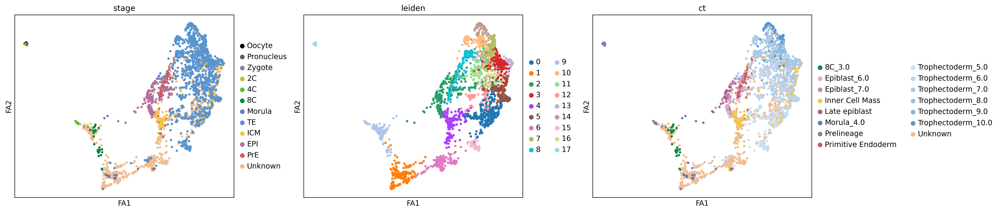

In [23]:
sc.pl.draw_graph(human, color=['stage', 'leiden', 'ct'], frameon=True, wspace=0.2, save="_dr_.svg")

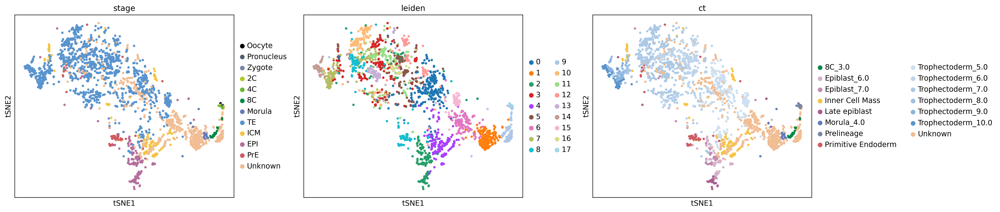

In [24]:
sc.pl.tsne(human, color=['stage', 'leiden', 'ct'], frameon=True, wspace=0.2, save="_dr_.svg")

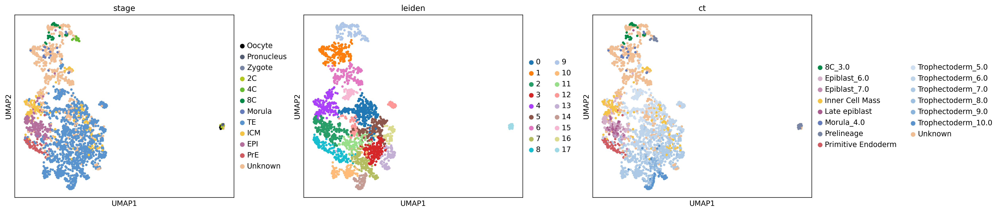

In [25]:
sc.pl.umap(human, color=['stage', 'leiden', 'ct'], frameon=True, wspace=0.2, save="_dr_.svg")

### FA plot

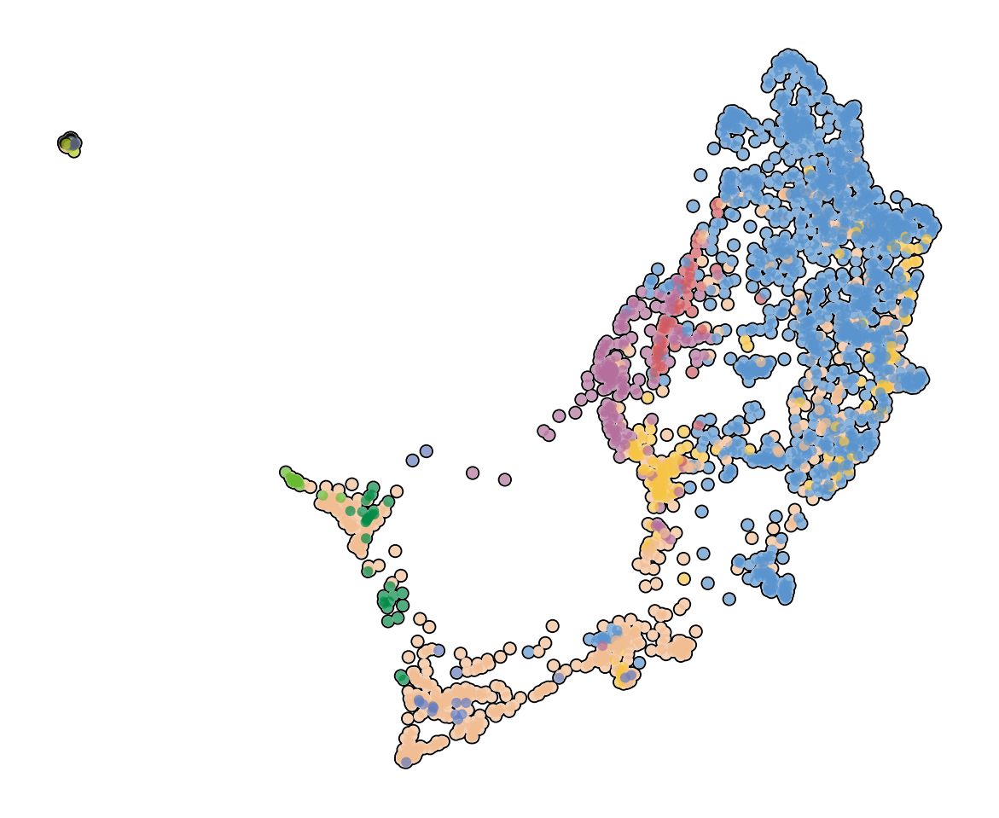

In [34]:
sc.pl.embedding(human, basis='X_draw_graph_fa', color=['stage'], title='', legend_loc=None,
                frameon=False, **extras, save="_stage.svg")

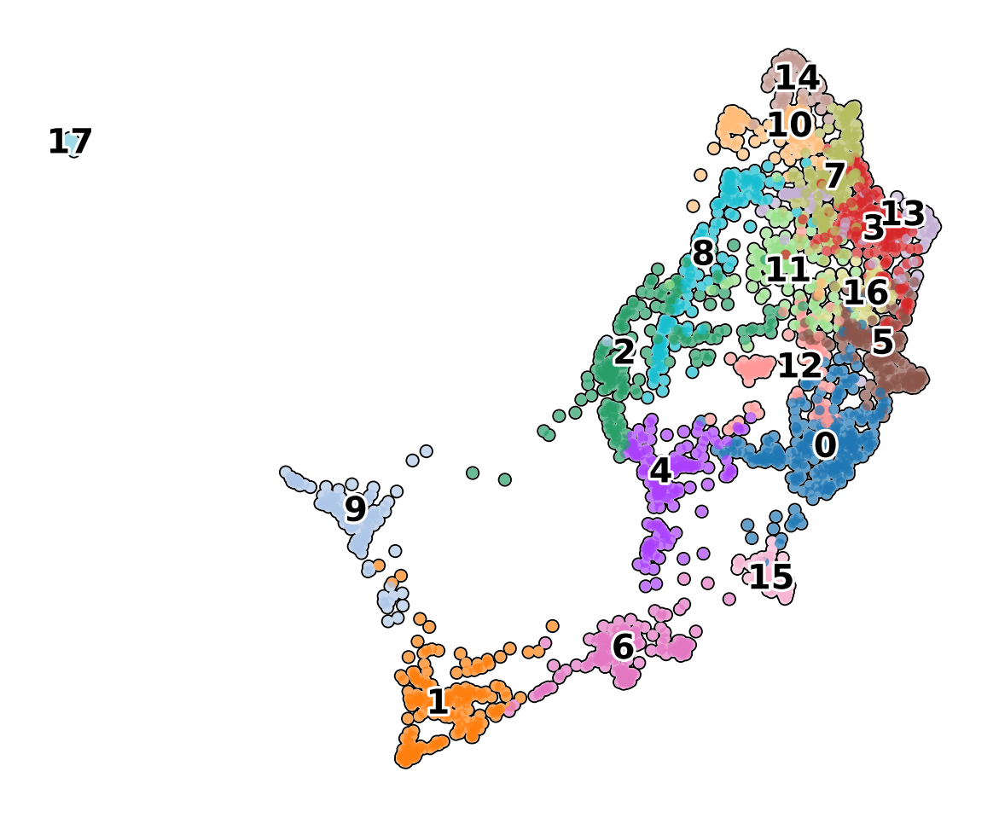

In [35]:
sc.pl.embedding(human, basis='X_draw_graph_fa', color='leiden', title='', legend_loc='on data', legend_fontoutline=2,
                frameon=False, **extras, save="_leiden.svg")

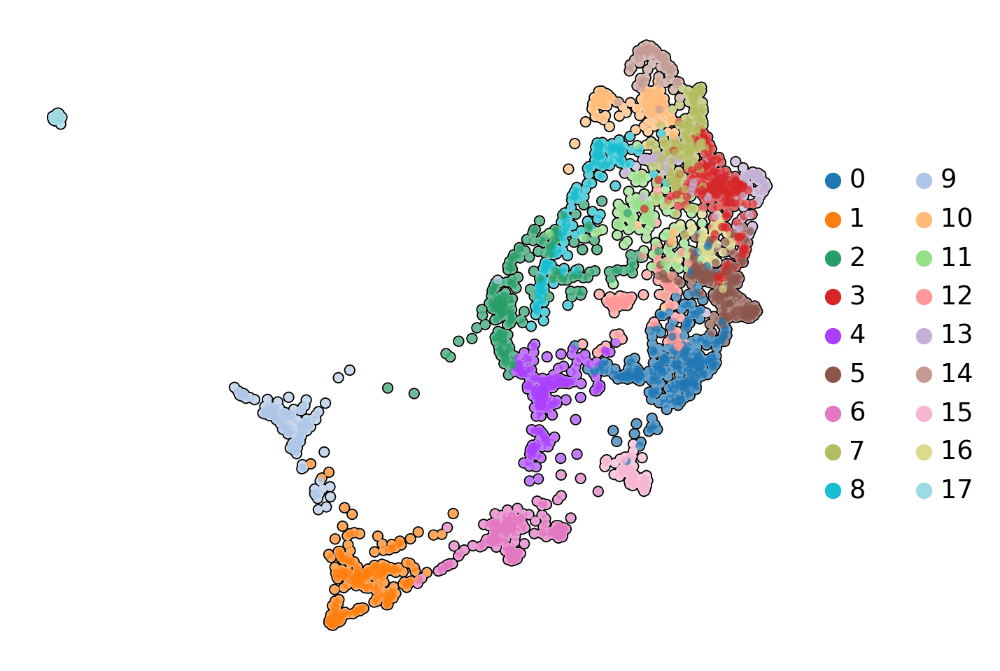

In [36]:
sc.pl.embedding(human, basis='X_draw_graph_fa', color='leiden', title='', frameon=False, **extras, save="_leiden_2.svg")

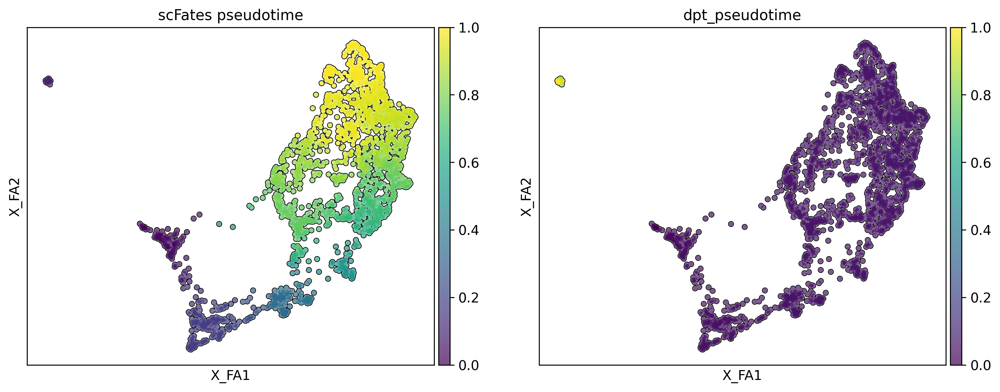

In [37]:
human.obs['t_scaled'] = MinMaxScaler().fit_transform(human.obs['t'].values.reshape(-1, 1)).flatten()

sc.pl.embedding(human, basis='X_draw_graph_fa', color=['t_scaled', 'dpt_pseudotime'], title=['scFates pseudotime', 'dpt_pseudotime'], 
                legend_loc=None, colorbar_loc='right', frameon=True, cmap='viridis', **extras, save="_pseudotimes.svg")

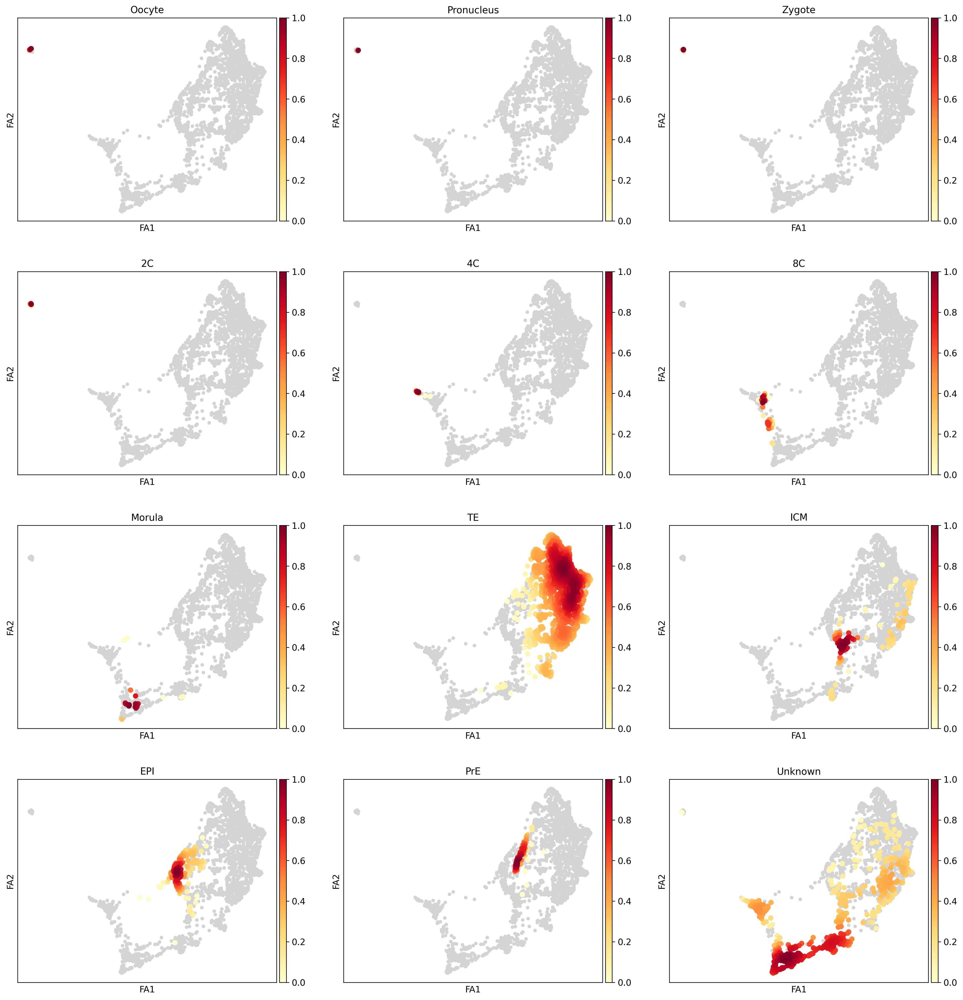

In [38]:
sc.tl.embedding_density(human, basis='draw_graph_fa', groupby='stage')
sc.pl.embedding_density(human, basis='draw_graph_fa', key='draw_graph_fa_density_stage', ncols=3, save='.svg')

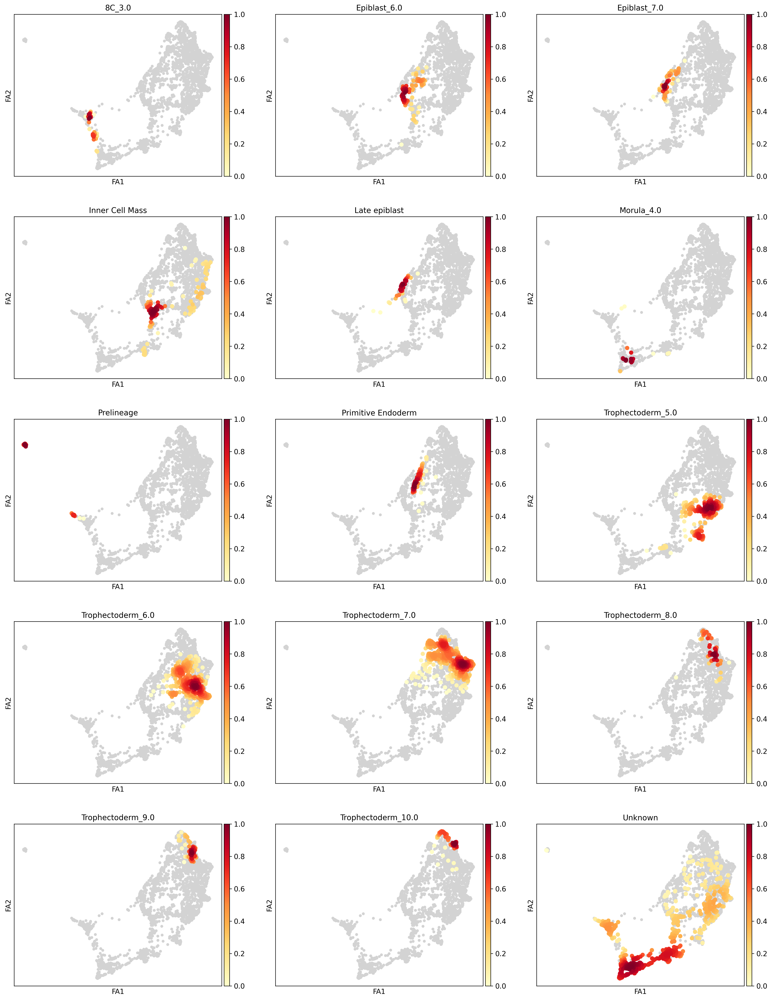

In [39]:
sc.tl.embedding_density(human, basis='draw_graph_fa', groupby='ct')
sc.pl.embedding_density(human, basis='draw_graph_fa', key='draw_graph_fa_density_ct', ncols=3, save='.svg')

### PAGA

saving figure to file ../figures/human/scvelo_ct.svg


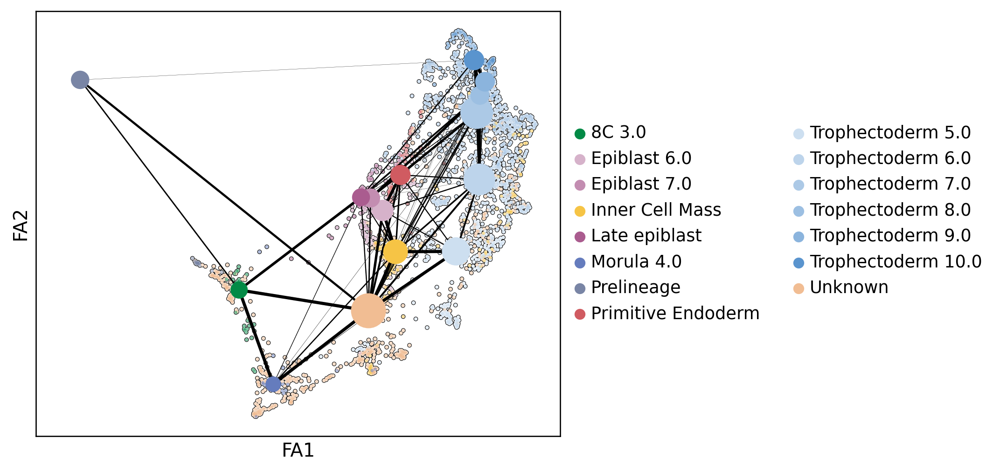

In [40]:
scv.pl.paga(human, basis='draw_graph_fa', title="", **extras, frameon=True, save="ct.svg")

### scGEN

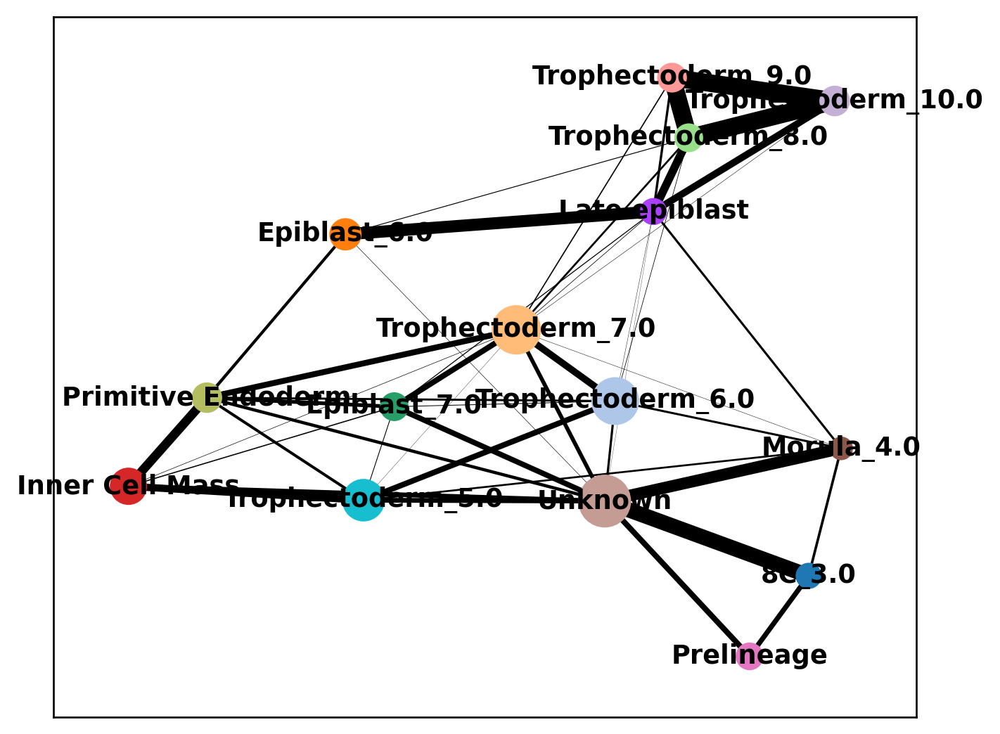

In [41]:
human_scgen = sc.read("../results/02_human_integration/scgen/adata.h5ad")

sc.pp.neighbors(human_scgen, use_rep='X_scgen')
sc.tl.diffmap(human_scgen)
sc.tl.paga(human_scgen, groups='ct')
sc.pl.paga(human_scgen)
sc.tl.draw_graph(human_scgen, init_pos='paga', n_jobs=10)

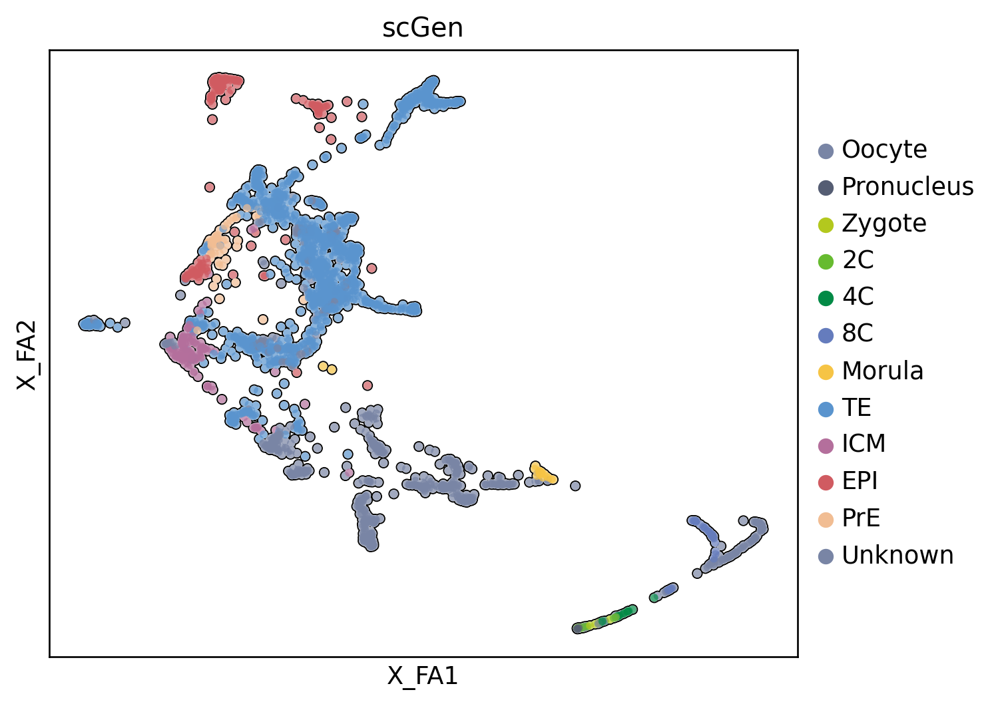

In [43]:
human_scgen.uns['stage_colors'] = list(lineage_colors.values())[1:] + [lineage_colors['Zygote']]
sc.pl.embedding(human_scgen, basis='X_draw_graph_fa', color=['stage'], title='scGen',
                **extras, save="_scgen_stage.svg")

## Trajectory segmentation

In [44]:
import scFates as scf

In [ ]:
# with plt.rc_context({"figure.figsize": (6, 6)}):
fig, ax = plt.subplots(1, 3, figsize=[18, 5])
scf.pl.dendrogram(human,color="seg", show=False, ax=ax[0])
scf.pl.dendrogram(human,color="ct", legend_loc="on data", color_milestones=True, legend_fontoutline=True, show=False, ax=ax[1])
sc.pl.embedding(human, basis='X_draw_graph_fa', color='seg', ax=ax[2])
fig.tight_layout()
fig.savefig("../figures/human/scfates.svg")

## CellRank

In [ ]:
from cellrank.kernels import PseudotimeKernel

pk = PseudotimeKernel(human, time_key="t")
pk.compute_transition_matrix()
g = cr.estimators.GPCCA(pk)
g.fit(cluster_key="stage", n_states=[4, 12])
g.predict_terminal_states(n_states=3)
g.predict_initial_states(allow_overlap=True)
g.compute_fate_probabilities()

In [ ]:
human.uns['clusters_gradients_colors'] = [lineage_colors['Zygote'], lineage_colors['TE'], lineage_colors['PrE'], lineage_colors['EPI']]
g.plot_fate_probabilities(same_plot=True, basis='X_draw_graph_fa', **extras, legend_loc=False, save="human_terminal_stages.svg")

In [ ]:
g.plot_fate_probabilities(same_plot=False, basis='X_draw_graph_fa', legend_loc=False, **extras, save="human_terminal_stages_all.svg")

## Stats: Cell compositions

In [ ]:
experiment_stats = human.obs.groupby(['experiment', 'stage']).apply(len).unstack().fillna(0).iloc[::-1]
experiment_stats.plot(kind='barh', stacked=True, color=lineage_colors)

for y, x in enumerate(experiment_stats.sum(axis=1).astype(int)):
    plt.annotate(str(x), xy=(x + 10, y), va='center')

plt.gca().spines[['right', 'top']].set_visible(False)
plt.gca().legend(frameon=False)
_ = plt.ylabel('Publications')
_ = plt.xlabel('Number of cells')
plt.savefig("../figures/human/stats_publications.svg")

In [ ]:
lineage_stats = human.obs.groupby('stage').apply(len).iloc[::-1]
lineage_stats.plot(kind='barh', color=list(lineage_colors.values()))

for y, x in enumerate(lineage_stats.astype(int)):
    plt.annotate(str(x), xy=(x + 10, y), va='center')

plt.gca().spines[['right', 'top']].set_visible(False)
_ = plt.ylabel('Lineage')
_ = plt.xlabel('Number of cells')
plt.savefig("../figures/human/stats_stages.svg")

In [ ]:
leiden_stats = sc.metrics.confusion_matrix('stage', 'leiden', data=human.obs) * 100
leiden_stats.plot(kind='barh', stacked=True)

plt.gca().spines[['right', 'top']].set_visible(False)
plt.gca().legend(title='Clusters', bbox_to_anchor=(0.99, 1.02), loc='upper left', frameon=False)
_ = plt.ylabel('Lineages')
_ = plt.xlabel('Cluster %')
plt.savefig("../figures/human/stats_cluster_vs_lineages.svg")

In [ ]:
leiden_stats = sc.metrics.confusion_matrix('leiden', 'stage', data=human.obs) * 100
leiden_stats.plot(kind='barh', stacked=True, color=lineage_colors)

plt.gca().spines[['right', 'top']].set_visible(False)
plt.gca().legend(title='Clusters', bbox_to_anchor=(0.99, 1.02), loc='upper left', frameon=False)
_ = plt.ylabel('Lineages')
_ = plt.xlabel('Cluster %')
plt.savefig("../figures/human/stats_cluster_vs_lineages.svg")

In [ ]:
sc.pl.embedding(human, basis='X_draw_graph_fa', color=['stage', 'leiden'], title='', frameon=False)

In [ ]:
leiden_stats = sc.metrics.confusion_matrix('leiden', 'stage', data=human.obs) * 100
leiden_stats_order = ['17', '9', '1', '6', '15', '4', '2', '8', '0', '12', '11', '5', '16', '7', '3', '13', '10', '14']
leiden_stats.loc[leiden_stats_order[::-1]].plot(kind='barh', stacked=True, color=lineage_colors)

plt.gca().spines[['right', 'top']].set_visible(False)
plt.gca().legend(title='Clusters', bbox_to_anchor=(0.99, 1.02), loc='upper left', frameon=False)
_ = plt.ylabel('Lineages')
_ = plt.xlabel('Cluster %')
plt.savefig("../figures/human/stats_cluster_vs_lineages.svg")

In [ ]:
technology_stats = human.obs.groupby('technology').apply(len).sort_values()
technology_stats.plot(kind='barh', color='grey')

for y, x in enumerate(technology_stats.astype(int)):
    plt.annotate(str(x), xy=(x + 10, y), va='center')

plt.gca().spines[['right', 'top']].set_visible(False)
_ = plt.ylabel('Technology')
_ = plt.xlabel('Number of cells')
plt.savefig("../figures/human/stats_technology.svg")

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=[20, 4])

# Plot #1
experiment_stats = experiment_stats.loc[experiment_stats.sum(axis=1).sort_values().index.tolist()]
experiment_stats.plot(kind='barh', stacked=True, color=lineage_colors, ax=ax[0])
for y, x in enumerate(experiment_stats.sum(axis=1).astype(int)):
    ax[0].annotate(str(x), xy=(x + 10, y), va='center')
ax[0].spines[['right', 'top']].set_visible(False)
ax[0].legend(frameon=False)
ax[0].set_ylabel('Publications')
ax[0].set_xlabel('Number of cells')

# Plot #2
lineage_stats = human.obs.groupby('stage').apply(len)
lineage_stats.plot(kind='barh', color=list(lineage_colors.values()), ax=ax[1])
for y, x in enumerate(lineage_stats.astype(int)):
    ax[1].annotate(str(x), xy=(x + 10, y), va='center')
ax[1].spines[['right', 'top']].set_visible(False)
ax[1].set_ylabel('Lineage')
ax[1].set_xlabel('Number of cells')

# Plot #3
technology_stats = human.obs.groupby('technology').apply(len).sort_values()
technology_stats.plot(kind='barh', color='grey', ax=ax[2])
for y, x in enumerate(technology_stats.astype(int)):
    ax[2].annotate(str(x), xy=(x + 10, y), va='center')
ax[2].spines[['right', 'top']].set_visible(False)
ax[2].set_ylabel('Technology')
ax[2].set_xlabel('Number of cells')

# Plot #4
leiden_stats = sc.metrics.confusion_matrix('leiden', 'stage', data=human.obs) * 100
leiden_stats.plot(kind='barh', stacked=True, ax=ax[3])
ax[3].spines[['right', 'top']].set_visible(False)
ax[3].legend(title='Clusters', bbox_to_anchor=(0.99, 1.02), loc='upper left', frameon=False)
ax[3].set_ylabel('Lineages')
ax[3].set_xlabel('Cluster %')

fig.tight_layout(w_pad=1)
fig.savefig("../figures/human/stats_all.svg")

## SCVI DGEs

In [ ]:
m_lineage = vae.differential_expression(groupby="stage")
m_lineage_filt = filter_markers(m_lineage, n_genes=10)

display(pd.DataFrame.from_dict(m_lineage_filt, orient='index').transpose())

sc.pl.dotplot(human, m_lineage_filt, groupby='stage', dendrogram=False, standard_scale='var')
sc.pl.matrixplot(human, m_lineage_filt, groupby='stage', dendrogram=False, standard_scale='var')

## Markers

In [ ]:
sc.pl.embedding(human, basis='X_draw_graph_fa', color=['t_scaled', 'day'], legend_loc=None, colorbar_loc='right', frameon=True, cmap='viridis')

In [ ]:
# vae = scvi.model.SCVI.load("../results/02_human_integration/scvi/", human)

In [ ]:
ENSG_to_SYMBOL = pd.read_csv('../data/external/human/Homo_sapiens.GRCh38.110.ENSG_to_SYMBOL.tsv', delimiter=" ", header=None)
ENSG_to_SYMBOL.columns = ['ensembl','symbol']
ENSG_to_SYMBOL_noName = pd.read_csv('../data/external/human/Homo_sapiens.GRCh38.110.ENSG_to_SYMBOL_noName.tsv', delimiter=" ", header=None)
nameless_df = pd.DataFrame(
    data = {
        'ensembl' : list(set(ENSG_to_SYMBOL_noName[0].tolist()) - set(ENSG_to_SYMBOL.ensembl.tolist())),
        'symbol' : list(set(ENSG_to_SYMBOL_noName[0].tolist()) - set(ENSG_to_SYMBOL.ensembl.tolist())),
    })
ENSG_to_SYMBOL = pd.concat([ENSG_to_SYMBOL, nameless_df])
ENSG_to_SYMBOL.set_index('ensembl', inplace=True)

In [ ]:
# markers: 
# oocytes: https://www.sciencedirect.com/science/article/pii/S2451965021000417
# everything: https://rep.bioscientifica.com/view/journals/rep/135/5/635.xml

human_raw = human.raw.to_adata()
human_raw = human_raw[human_raw.obs.stage != "Unknown"].copy()
human_raw.var_names = ENSG_to_SYMBOL.loc[human_raw.var_names, 'symbol']
human_raw.var_names_make_unique()

pub_markers = {
    'Oocyte': ['DAZL', 'SOHLH2'],
    'Zygote': ['PADI6', 'DDX4'],
    'Pronucleus': ['ERBB4'],
    '2C': ['ZFP3'],
    '4C': ['SOX2'],
    '8C': ['LEUTX', 'ZSCAN4'],
    'Morula': ['FOXD3', 'GATA6'],
    'ICM': ['KLF4'],
    'TE': ['GATA3', 'CDX2'],
    'EPI': ['KLF7', 'NANOG'],
    'PrE': ['SOX17', 'GATA4'],
    # 'Unknown': [],
}
ax = sc.pl.dotplot(human_raw, sum(pub_markers.values(), []), groupby='stage', standard_scale='var', cmap='GnBu', figsize=[12, 3.5], show=False, use_raw=False)
_ = ax['mainplot_ax'].set_xticklabels(sum(pub_markers.values(), []), rotation = 45, ha="right", rotation_mode="anchor")
plt.savefig("../figures/human/dotplot_pub_markers.svg")

## Classifiers

In [111]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize

human_adata = sc.read('../results/02_human_integration/05_scanvi_ns15/adata.h5ad')
human_adata.obs.day = human_adata.obs.day.astype('category')
human_adata.obs.ct_fine = human_adata.obs.ct_fine.cat.reorder_categories(ct_colors.keys(), ordered=True)

human_adata.obs.C_scANVI_nsamples = human_adata.obs.C_scANVI_nsamples.cat.reorder_categories(list(ct_colors.keys())[:-1], ordered=True)

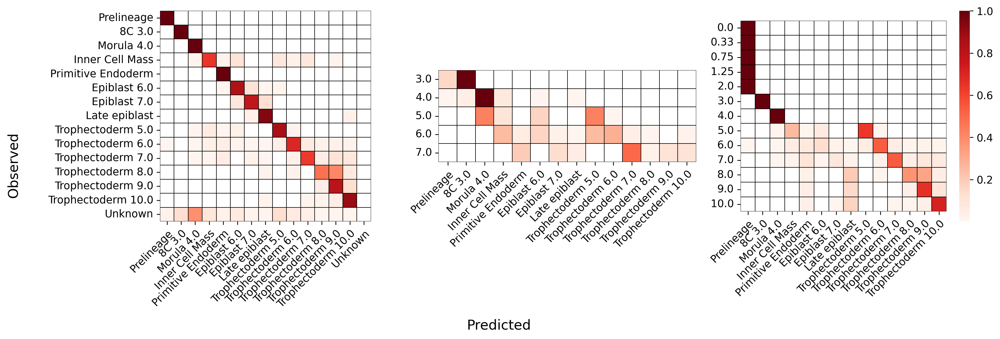

In [131]:
fig, ax = plt.subplots(1, 3, figsize=[15, 5])
CMAP = 'Reds'

df = pd.DataFrame(0, index=human_adata.obs.ct_fine.cat.categories, columns=human_adata.obs.ct_fine.cat.categories) + sc.metrics.confusion_matrix("ct_fine", "C_scANVI_nsamples", human_adata.obs)
df = df[human_adata.obs.ct_fine.cat.categories]
df[df == 0] = np.nan
sns.heatmap(df, linewidths=0.2, cmap=CMAP, ax=ax[0], square=True, cbar=None, linewidth=.5, linecolor='black')\
    .set(xlabel='', ylabel='', yticklabels=human_adata.obs.ct_fine.cat.categories.str.replace('_', ' '))
ax[0].set_xticklabels(df.columns.str.replace('_', ' '), rotation=45, ha="right", rotation_mode="anchor")

unknown_cells_adata = human_adata[human_adata.obs['ct_fine'].isin(['Unknown'])].copy()
unknown_cells_adata.obs['day_str'] = unknown_cells_adata.obs['day'].astype(str)
df = sc.metrics.confusion_matrix("day_str", "C_scANVI_nsamples", unknown_cells_adata.obs)
df = df[human_adata.obs.ct_fine.cat.categories.intersection(df.columns)]
df[df == 0] = np.nan
sns.heatmap(df, linewidths=0.2, cmap=CMAP, ax=ax[1], square=True, cbar=None, linewidth=.5, linecolor='black').set(xlabel='', ylabel='')
ax[1].set_yticklabels(df.index, rotation=0, ha="right", rotation_mode="anchor")
ax[1].set_xticklabels(df.columns.str.replace('_', ' '), rotation=45, ha="right", rotation_mode="anchor")

known_cells_adata = human_adata[~human_adata.obs['ct_fine'].isin(['Unknown'])].copy()
known_cells_adata.obs['day_str'] = known_cells_adata.obs['day'].astype(str)
df = sc.metrics.confusion_matrix("day_str", "C_scANVI_nsamples", known_cells_adata.obs)
df = df[known_cells_adata.obs.ct_fine.cat.categories]
df[df == 0] = np.nan
sns.heatmap(df, linewidths=0.2, cmap=CMAP, ax=ax[2], square=True, cbar=True, linewidth=.5, linecolor='black').set(xlabel='', ylabel='')
ax[2].set_yticklabels(df.index, rotation=0, ha="right", rotation_mode="anchor")
ax[2].set_xticklabels(df.columns.str.replace('_', ' '), rotation=45, ha="right", rotation_mode="anchor")

fig.supxlabel('Predicted')
fig.supylabel('Observed')
fig.tight_layout()
fig.savefig("../figures/human/00_clf_confusion_mat.svg")

### ICM re-annotation

In [47]:
icm_adata = human_adata[human_adata.obs['ct_orig'].isin(['Inner Cell Mass', 'Primitive Endoderm', 'Epiblast'])].copy()

icm_adata.uns['ct_fine_colors'] = [ct_colors[x] for x in icm_adata.obs.ct_fine.cat.categories]
icm_adata.uns['C_scANVI_nsamples_colors'] = [ct_colors[x] for x in icm_adata.obs.C_scANVI_nsamples.cat.categories]

sc.tl.pca(icm_adata, svd_solver='arpack')
sc.pp.neighbors(icm_adata, use_rep='X_scVI')
sc.tl.umap(icm_adata)
sc.tl.leiden(icm_adata)

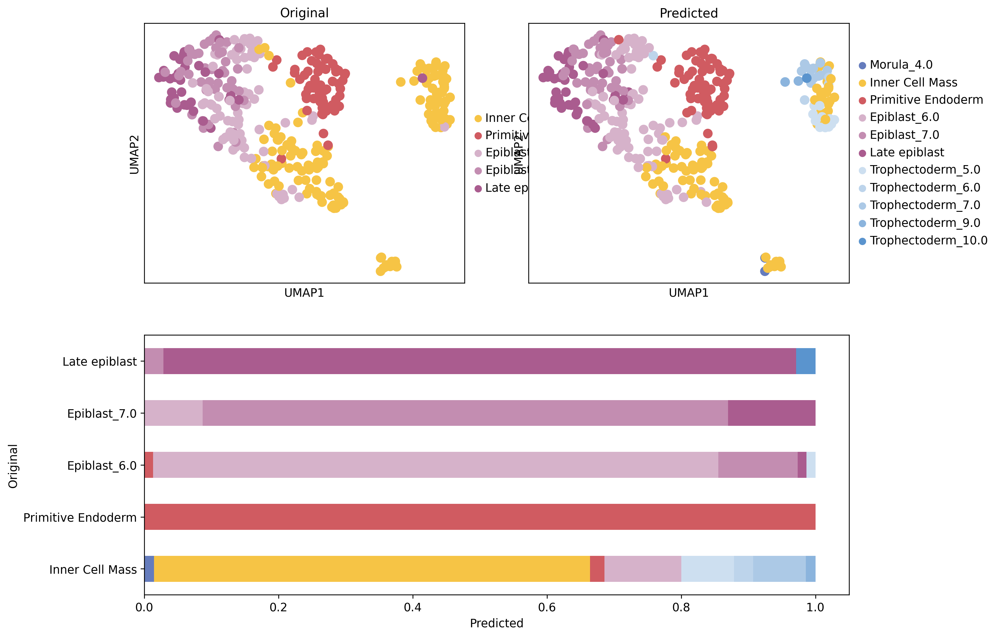

In [48]:
fig = plt.figure(figsize=[12,10])

gs = fig.add_gridspec(2,2)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

sc.pl.umap(icm_adata, color = 'ct_fine', ax=ax1, show=False, title='Original')
sc.pl.umap(icm_adata, color = 'C_scANVI_nsamples', ax=ax2, show=False, title='Predicted')
sc.metrics.confusion_matrix('ct_fine', 'C_scANVI_nsamples', icm_adata.obs).plot(kind='barh', stacked=True, ax=ax3, color=ct_colors, ylabel='Original', xlabel='Predicted', legend=None)

fig.savefig("../figures/human/00_ICM_prediction.svg")

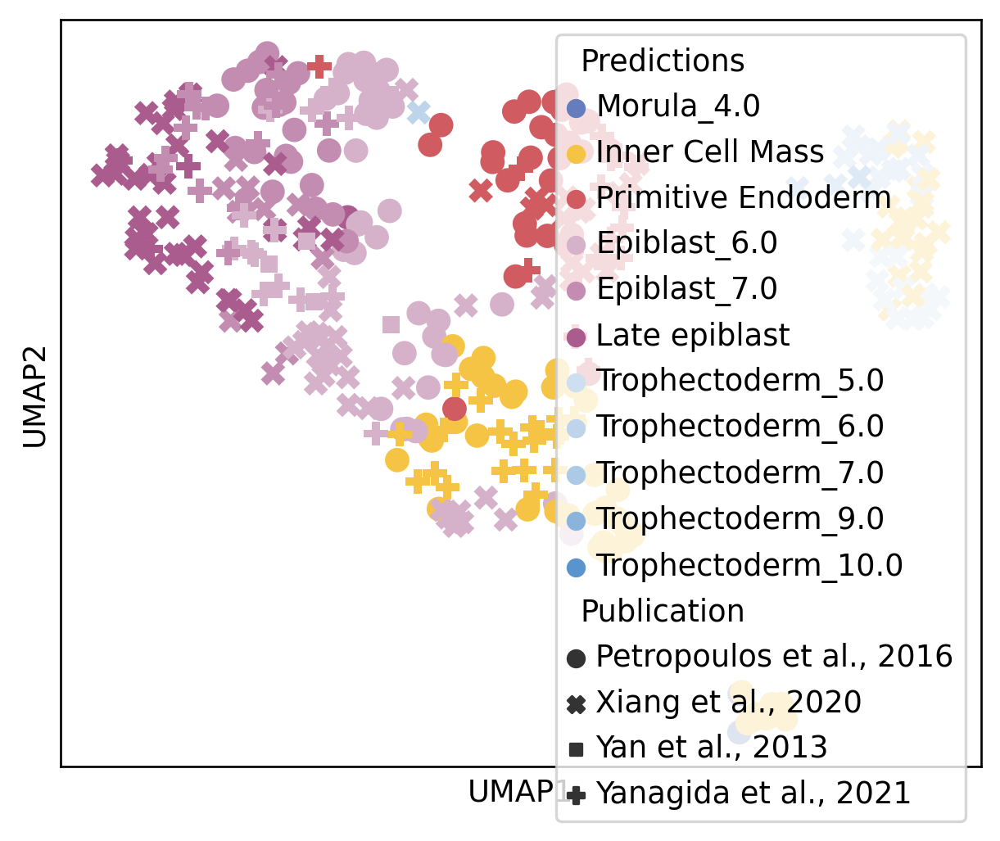

In [110]:
df = pd.DataFrame(icm_adata.obsm['X_umap'], columns = ['UMAP1', 'UMAP2'])\
        .assign(Publication = icm_adata.obs.experiment.values)\
        .assign(Predictions = icm_adata.obs.C_scANVI_nsamples.values)

g = sns.scatterplot(x='UMAP1', y='UMAP2', hue='Predictions', style='Publication', s=80, palette=ct_colors, linewidth=0, data=df)
g.set(xticks=[], yticks=[], xticklabels=[])
plt.savefig("../figures/human/00_ICM_prediction_2.svg")

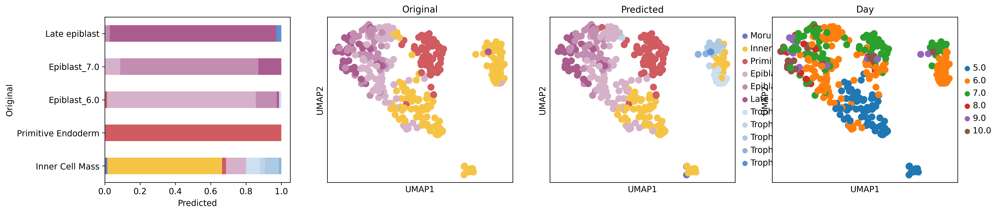

In [49]:
fig, ax = plt.subplots(1,4, figsize=[20, 4])

sc.metrics.confusion_matrix('ct_fine', 'C_scANVI_nsamples', icm_adata.obs).plot(kind='barh', stacked=True, ax=ax[0], color=ct_colors, ylabel='Original', xlabel='Predicted', legend=None)
sc.pl.umap(icm_adata, color = 'ct_fine', show=False, title='Original', legend_loc=None, ax=ax[1])
sc.pl.umap(icm_adata, color = 'C_scANVI_nsamples', show=False, title='Predicted', ax=ax[2])
sc.pl.umap(icm_adata, color = 'day', show=False, title='Day', ax=ax[3])
fig.savefig("../figures/human/00_ICM_prediction_suppl.svg")

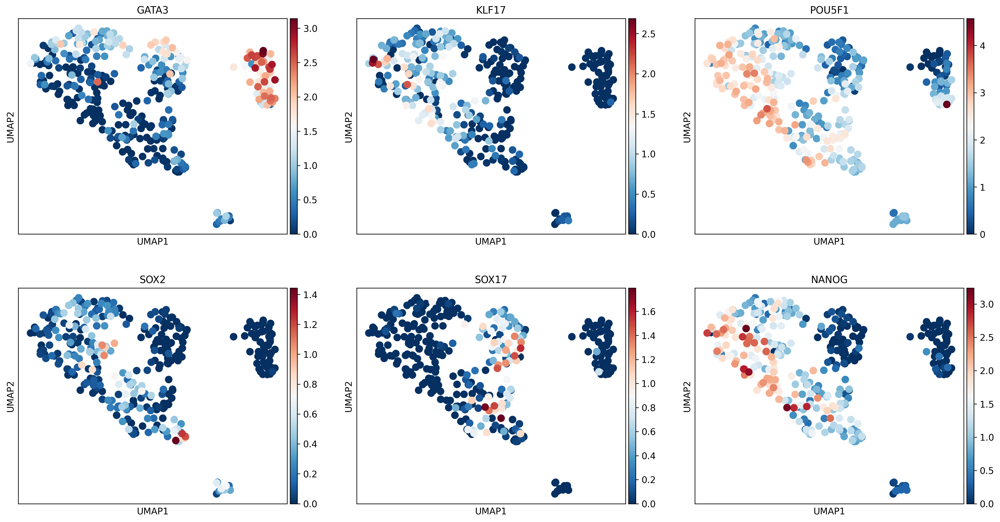

In [50]:
sc.pl.umap(icm_adata, color = ['ENSG00000107485', 'ENSG00000171872', 'ENSG00000204531', 'ENSG00000181449','ENSG00000164736','ENSG00000111704'], 
           title=['GATA3', 'KLF17', 'POU5F1', 'SOX2', 'SOX17', 'NANOG'], ncols=3, save="00_ICM_prediction_suppl.svg")

In [55]:
# sc.pl.umap(icm_adata, color = ['ct_fine', 'ENSG00000107485', 'ENSG00000171872', 'ENSG00000204531', 'C_scANVI_nsamples', 'ENSG00000181449','ENSG00000164736','ENSG00000111704'], 
#            title=['Original annotation', 'GATA3', 'KLF17', 'POU5F1', 'Predicted', 'SOX2', 'SOX17', 'NANOG'], ncols=4, save="00_ICM_prediction_suppl.svg", frameon=False, wspace=0.2)

## C_scANVI_nsamples

In [176]:
import scFates as scf

In [177]:
human_scfates = human.copy()
human_scfates.obs['C_scANVI_nsamples'] = scvi.model.SCANVI.load("../results/02_human_integration/05_scanvi_ns15/").adata.obs.C_scANVI_nsamples
human_scfates.uns['C_scANVI_nsamples_colors'] = [ct_colors[x] for x in human_scfates.obs.C_scANVI_nsamples.cat.categories]

INFO     File ../results/02_human_integration/05_scanvi_ns15/model.pt already downloaded                           


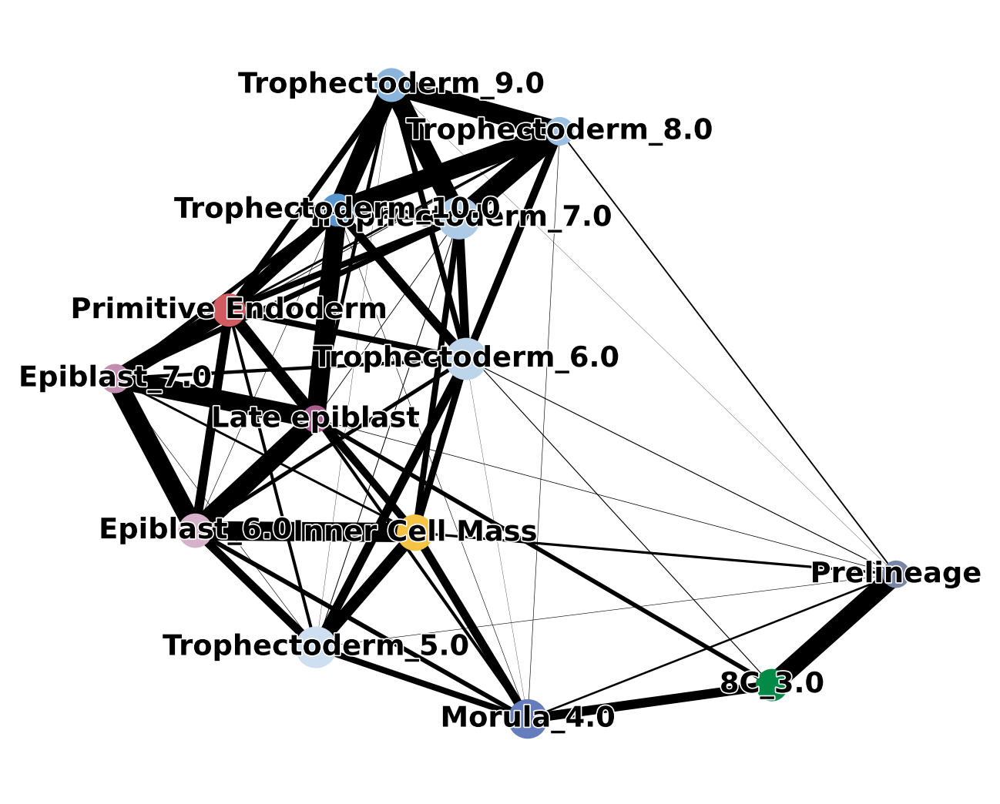

In [178]:
sc.tl.paga(human_scfates, groups='C_scANVI_nsamples')
sc.pl.paga(human_scfates, color=['C_scANVI_nsamples'], frameon=False, fontoutline=True)
sc.tl.draw_graph(human_scfates, init_pos='paga', n_jobs=10)

In [179]:
sc.pp.neighbors(human_scfates, use_rep="X_scVI")
sc.tl.draw_graph(human_scfates, n_jobs=10, random_state=9)

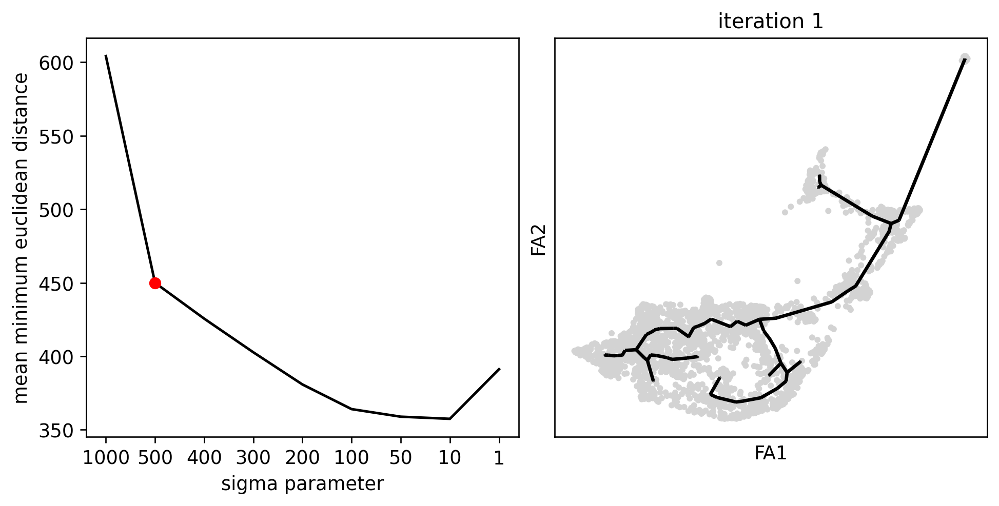

In [180]:
sig = scf.tl.explore_sigma(human_scfates,
                         # Nodes=20,
                         Nodes=60,
                         use_rep="X_draw_graph_fa",
                         sigmas=[1000,500,400,300,200,100,50,10,1],
                         seed=42,plot=True)

In [181]:
scf.tl.tree(human_scfates,
            # Nodes=30,
            Nodes=70,
            use_rep="X_draw_graph_fa",
            method="ppt",
            ppt_nsteps=10,
            ppt_sigma=sig,
            ppt_lambda=100,
            seed=42)

inferring a principal tree --> parameters used 
    70 principal points, sigma = 500, lambda = 100, metric = euclidean
    fitting: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 249.68it/s]
    not converged (error: 0.182933549445047)
    finished (0:00:00) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


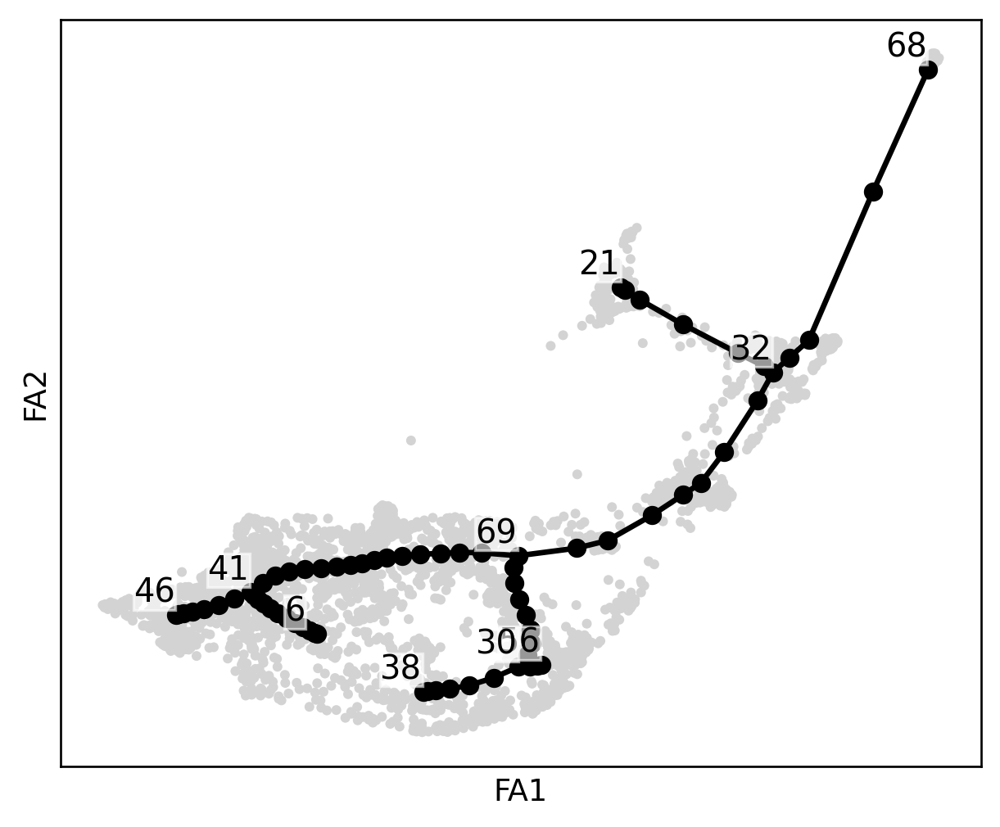

In [182]:
scf.pl.graph(human_scfates)

In [183]:
scf.tl.root(human_scfates, 68)

node 68 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [184]:
scf.tl.pseudotime(human_scfates,n_jobs=10,n_map=10,seed=42)

projecting cells onto the principal graph
    mappings: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:15<00:00,  1.53s/it]
    finished (0:00:16) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


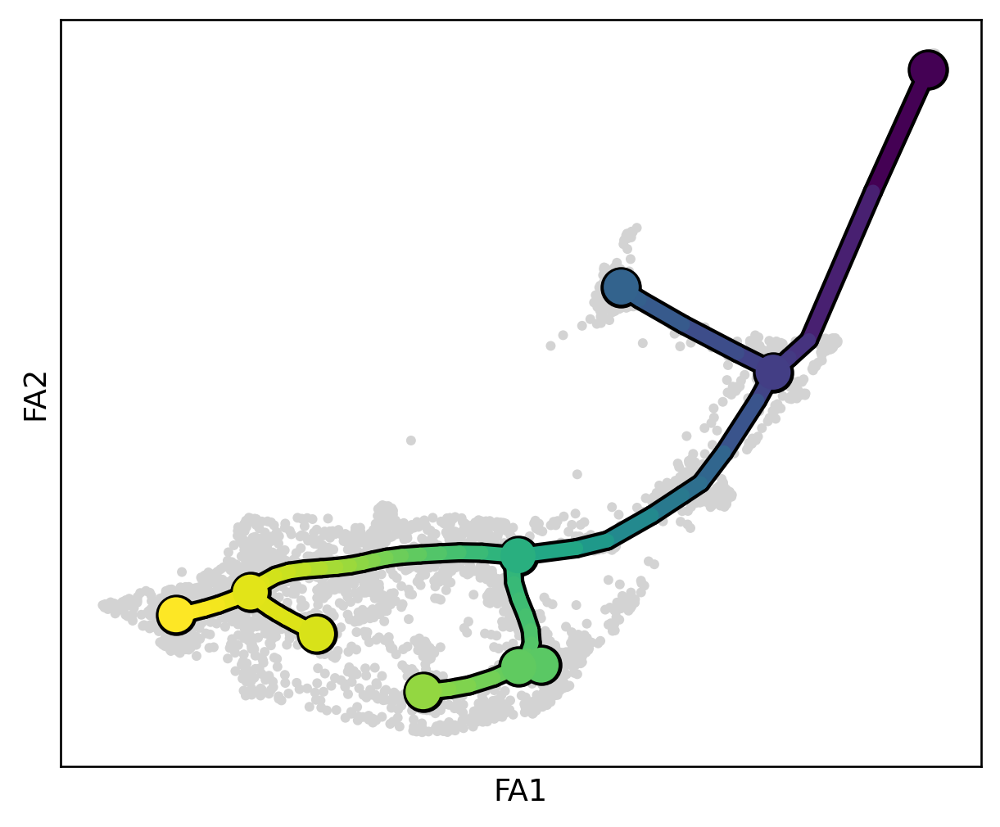

In [185]:
scf.pl.trajectory(human_scfates)

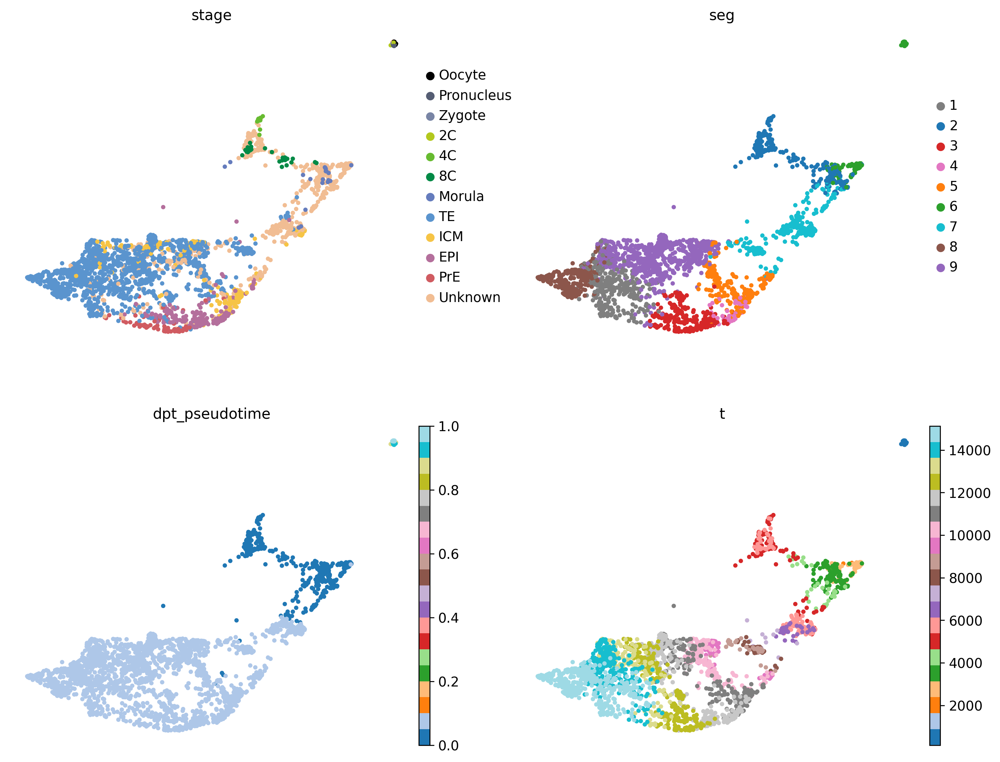

In [186]:
sc.pl.draw_graph(human_scfates, color=['stage', 'seg', 'dpt_pseudotime', 't'], frameon=False, ncols=2, cmap='tab20')

<Axes: title={'center': 't_scaled'}, xlabel='X_FA1', ylabel='X_FA2'>

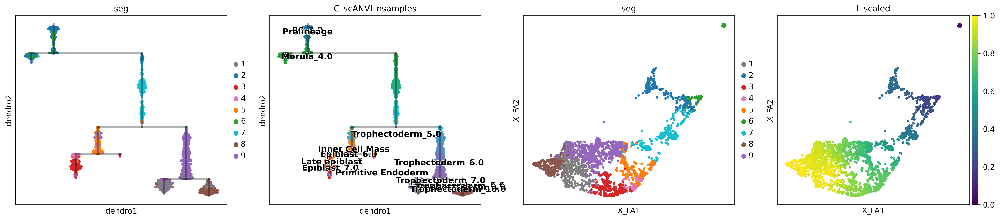

In [187]:
fig, ax = plt.subplots(1, 4, figsize=[25, 5])

human_scfates.obs['t_scaled'] = MinMaxScaler().fit_transform(human_scfates.obs['t'].values.reshape(-1, 1)).flatten()
scf.pl.dendrogram(human_scfates,color="seg", show=False, ax=ax[0])
scf.pl.dendrogram(human_scfates,color="C_scANVI_nsamples",legend_loc="on data",color_milestones=True,legend_fontoutline=True, show=False, ax=ax[1])
sc.pl.embedding(human_scfates, basis='X_draw_graph_fa', color='seg', show=False, ax=ax[2])
sc.pl.embedding(human_scfates, basis='X_draw_graph_fa', color='t_scaled', show=False, ax=ax[3], cmap='viridis')

In [188]:
human_scfates.uns.keys()

dict_keys(['_scvi_manager_uuid', '_scvi_uuid', 'ct_colors', 'ct_sizes', 'dendro_segments', 'diffmap_evals', 'draw_graph', 'draw_graph_fa_density_ct_params', 'experiment_colors', 'graph', 'hvg', 'iroot', 'leiden', 'milestones_colors', 'neighbors', 'paga', 'pca', 'ppt', 'pseudotime_list', 'stage_colors', 'timepoint_colors', 'tsne', 'umap', 'leiden_colors', 'draw_graph_fa_density_stage_params', 'C_scANVI_nsamples_colors', 'C_scANVI_nsamples_sizes', 'seg_colors'])

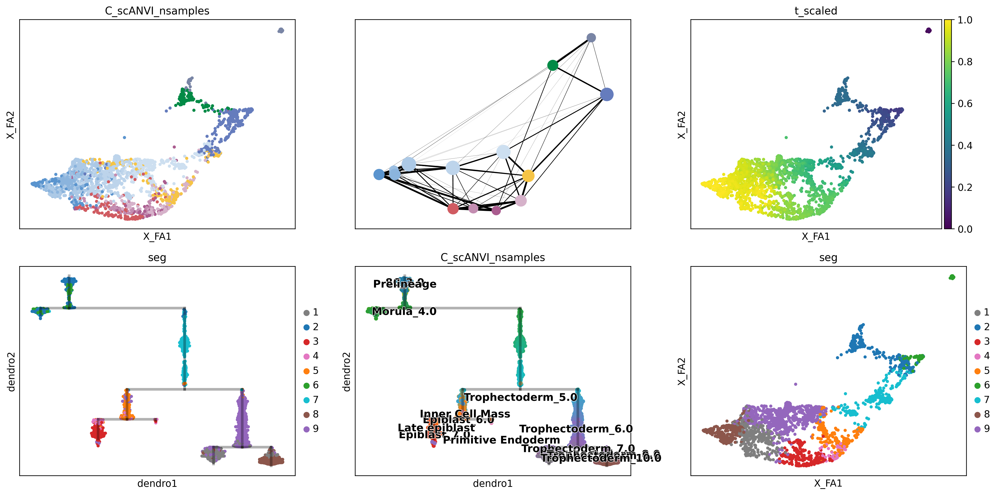

In [189]:
fig, ax = plt.subplots(2, 3, figsize=[16, 8])

sc.pl.embedding(human_scfates, basis='X_draw_graph_fa', color='C_scANVI_nsamples', show=False, ax=ax[0, 0], legend_loc=None)
scv.pl.paga(human_scfates, basis='draw_graph_fa', title="", frameon=True, show=False, ax=ax[0, 1])
sc.pl.embedding(human_scfates, basis='X_draw_graph_fa', color='t_scaled', show=False, ax=ax[0, 2], cmap='viridis')

scf.pl.dendrogram(human_scfates,color="seg", show=False, ax=ax[1, 0])
scf.pl.dendrogram(human_scfates,color="C_scANVI_nsamples",legend_loc="on data",color_milestones=True,legend_fontoutline=True, show=False, ax=ax[1, 1])
sc.pl.embedding(human_scfates, basis='X_draw_graph_fa', color='seg', show=False, ax=ax[1, 2])
fig.tight_layout()
fig.savefig("../figures/human/00_C_scANVI_nsamples.svg")

## Query [Rivron et al.,]

In [64]:
lvae = scvi.model.SCANVI.load("../results/02_human_integration/05_scanvi_ns15/")

query = sc.read_h5ad('../results/06_human_Rivron.h5ad')
query.obs['experiment'] = 'Rivron'

scvi.model.SCVI.prepare_query_anndata(query, lvae)
lvae_q = scvi.model.SCANVI.load_query_data(query, lvae)
lvae_q.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
    early_stopping=True
)

query.obsm["X_scANVI"] = lvae_q.get_latent_representation()
query.obs["predictions"] = lvae_q.predict()
query.obs['entropy'] = 1 - lvae_q.predict(soft=True).max(axis=1)

INFO     File ../results/02_human_integration/05_scanvi_ns15/model.pt already downloaded                           
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 100/100: 100%|█████████████████████████████| 100/100 [00:20<00:00,  5.47it/s, v_num=1, train_loss_step=4.71e+3, train_loss_epoch=4.74e+3]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█████████████████████████████| 100/100 [00:20<00:00,  4.80it/s, v_num=1, train_loss_step=4.71e+3, train_loss_epoch=4.74e+3]


In [65]:
sc.pp.highly_variable_genes(
    query,
    flavor="seurat_v3",
    n_top_genes=5_000,
    layer="counts",
    batch_key="batch",
    subset=True,
)
sc.pp.neighbors(query)
sc.tl.umap(query)
query.obs.predictions = query.obs.predictions.astype('category')
query.obs.predictions = query.obs.predictions.cat.reorder_categories([ct for ct in ct_colors if ct in query.obs.predictions.cat.categories], ordered=True)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [66]:
query.uns['flow_colors'] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#D3D3D3', '#8c564b']
query.uns['predictions_colors'] = [ct_colors[ct] for ct in query.obs.predictions.cat.categories]

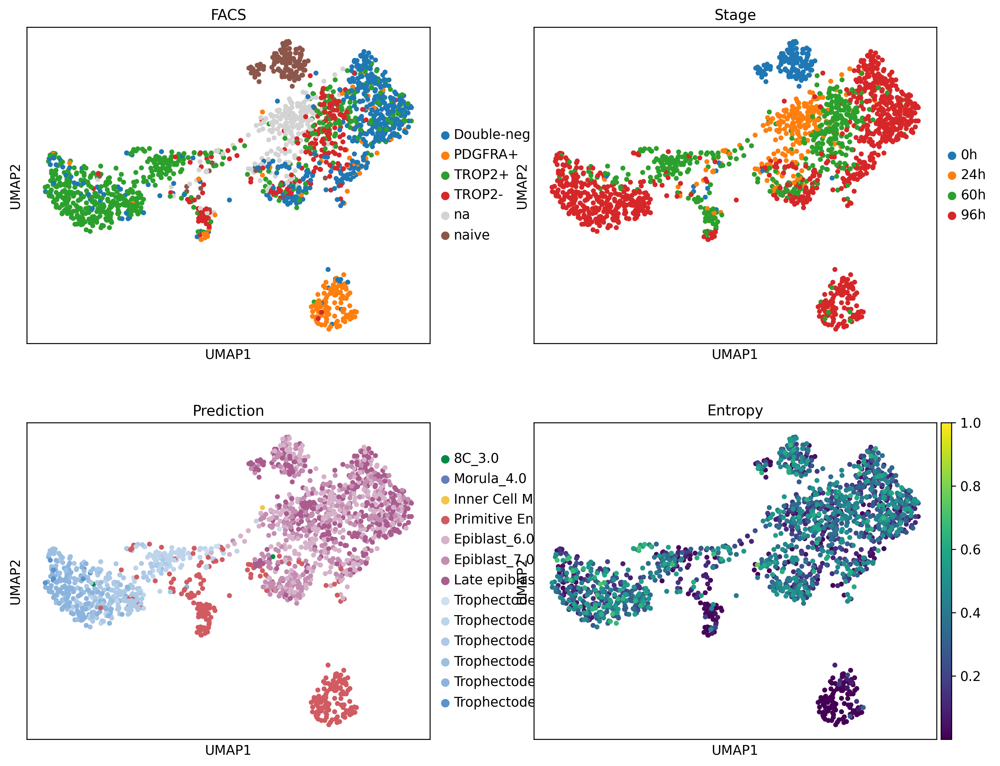

In [68]:
sc.pl.umap(query, color=['flow', 'time', 'predictions', 'entropy'], ncols=2, vmax=1, cmap='viridis', title=['FACS', 'Stage', 'Prediction', 'Entropy'],
           save='00_query_rivron.svg')

In [69]:
pd.crosstab(query.obs.predictions, query.obs.flow)

flow,Double-neg,PDGFRA+,TROP2+,TROP2-,na,naive
predictions,,,,,,
8C_3.0,1,0,0,1,0,0
Morula_4.0,1,0,0,0,0,0
Inner Cell Mass,0,1,0,0,0,0
Primitive Endoderm,33,121,33,34,17,5
Epiblast_6.0,141,7,44,81,65,42
Epiblast_7.0,89,7,73,47,74,32
Late epiblast,160,15,47,33,51,56
Trophectoderm_5.0,0,0,1,0,4,0
Trophectoderm_6.0,4,0,76,5,7,1


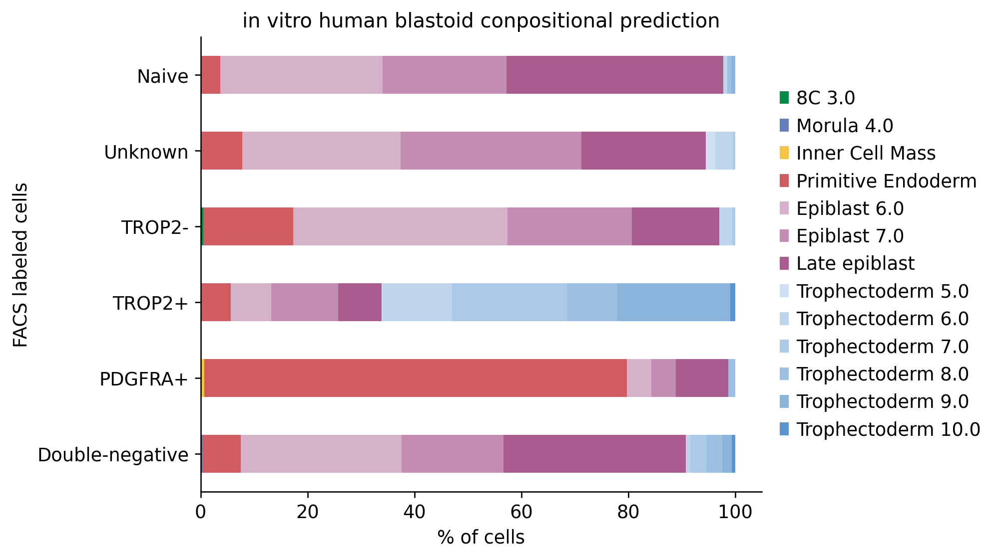

In [216]:
conf_mat = sc.metrics.confusion_matrix('flow', 'predictions', query.obs) * 100
conf_mat.index = ['Double-negative', 'PDGFRA+', 'TROP2+', 'TROP2-', 'Unknown', 'Naive']
conf_mat.plot.barh(stacked=True, color=ct_colors)
plt.legend(conf_mat.columns.str.replace('_', ' '), loc='center right', bbox_to_anchor=(1.42, 0.5), frameon=False)
plt.gca().spines[['right', 'top']].set_visible(False)
plt.xlabel('% of cells')
plt.ylabel('FACS labeled cells')
plt.title('in vitro human blastoid conpositional prediction')

plt.savefig("../figures/human/00_query_flow_predictions.svg")
sc.metrics.confusion_matrix('flow', 'predictions', query.obs, normalize=False).to_csv("../results/00_human_query.csv")

In [212]:
pd.crosstab(query.obs.predictions, query.obs.time)

time,0h,24h,60h,96h
predictions,,,,
8C_3.0,0,0,1,1
Morula_4.0,0,0,0,1
Inner Cell Mass,0,0,1,0
Primitive Endoderm,5,17,63,158
Epiblast_6.0,42,65,116,157
Epiblast_7.0,32,74,96,120
Late epiblast,56,51,54,201
Trophectoderm_5.0,0,4,1,0
Trophectoderm_6.0,1,7,64,21
